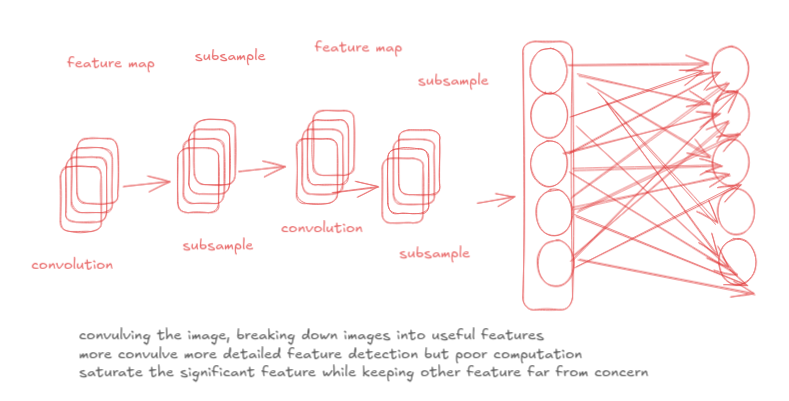

# importing required libraries


In [ ]:
import tensorflow as tf
import numpy as np
from tensorflow.keras import layers, models
import os
import matplotlib.pyplot as plt

loading dataset

In [ ]:
import tensorflow_datasets as tfds

(train_dataset, test_dataset), info = tfds.load(
    'horses_or_humans',
    split=['train','test'],
    as_supervised=True,
    with_info=True,
)
print(info)

In [ ]:
info.features['label'].names

0


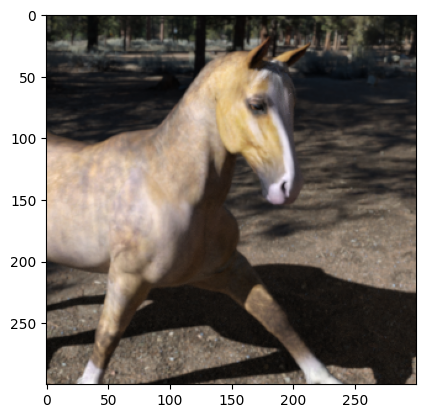

In [7]:
for image,label in train_dataset:
  print (label.numpy())
  plt.imshow(image.numpy())
  break

In [8]:
l1=[int(label)  for image,label in train_dataset]

In [9]:
l1

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,


In [13]:
from collections import Counter
Counter(l1)

Counter({0: 500, 1: 527})

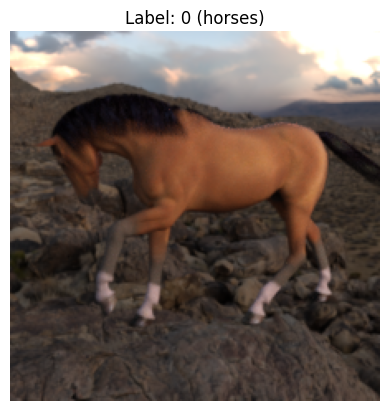

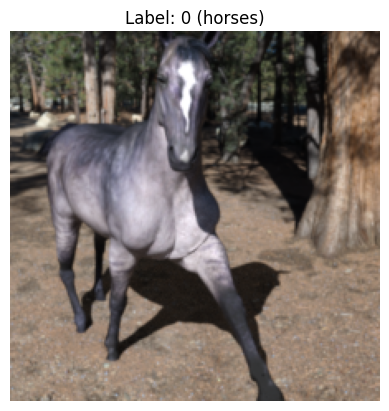

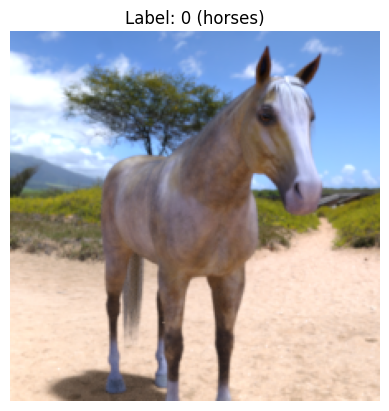

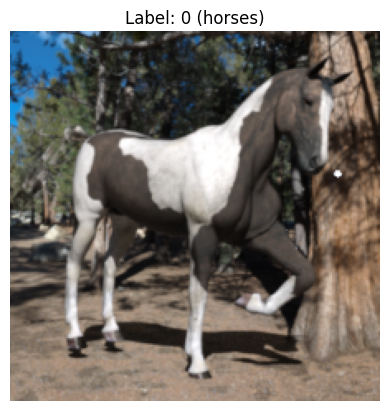

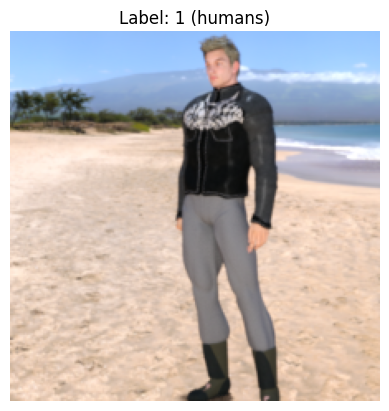

...

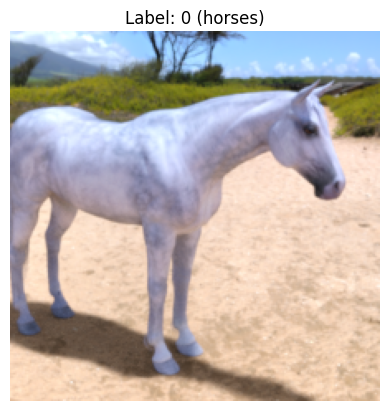

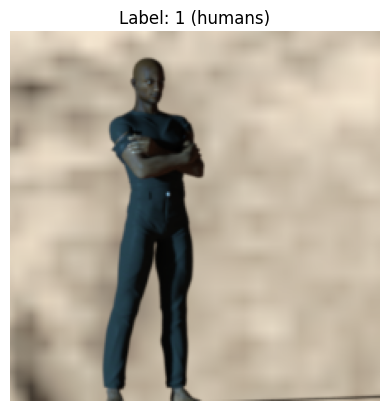

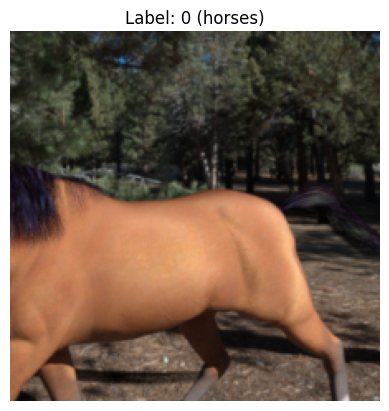

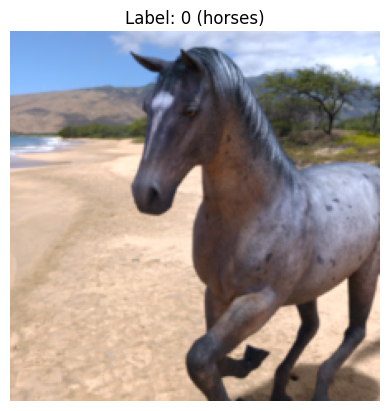

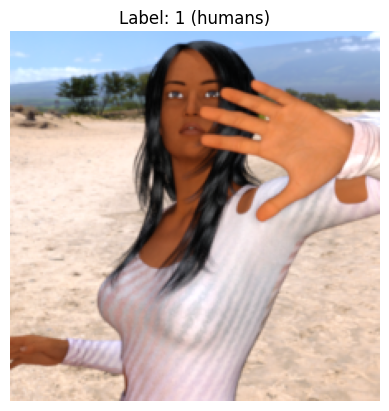

In [14]:
class_names = info.features['label'].names

for images, labels in train_ds.take(2):
  for image, label in zip(images, labels):
    plt.imshow(image)
    plt.title(f"Label: {label.numpy()} ({class_names[label.numpy()]})")
    plt.axis('off')
    plt.show()

In [44]:
def augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_brightness(image, max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.1)
    return image, label


Preprocessing the data

In [45]:
IMG_SIZE = 224
BATCH_SIZE=32
def preprocess_img(image, label):
  image = tf.image.resize(image,[IMG_SIZE,IMG_SIZE])
  image = tf.cast(image,tf.float32)/255.0
  return image,label

train_ds = train_dataset.map(preprocess_img).map(augment).shuffle(1000).batch(BATCH_SIZE)
test_ds = test_dataset.map(preprocess_img).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


training classifier

In [46]:
from tensorflow.keras import models, layers, regularizers

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.2),  # Dropout after first block

    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.3),  # Slightly higher dropout

    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Dropout(0.4),  # Stronger regularization in deeper layers

    layers.Flatten(),
    layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001)),  # L2 regularization
    layers.Dropout(0.5),  # Final dropout before output
    layers.Dense(1, activation='sigmoid')
])


/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Compile model

In [47]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])


train the model

In [60]:
history = model.fit(train_ds,epochs=28,validation_data=test_ds)

Epoch 1/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.9183 - loss: 0.4686 - val_accuracy: 0.6445 - val_loss: 1.7049
Epoch 2/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 68ms/step - accuracy: 0.9225 - loss: 0.3928 - val_accuracy: 0.6797 - val_loss: 2.8807
Epoch 3/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 4s 66ms/step - accuracy: 0.9841 - loss: 0.2157 - val_accuracy: 0.6797 - val_loss: 3.2065
Epoch 4/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.9760 - loss: 0.2049 - val_accuracy: 0.7383 - val_loss: 2.6551
Epoch 5/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step - accuracy: 0.9938 - loss: 0.1445 - val_accuracy: 0.7461 - val_loss: 2.1919
Epoch 6/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - accuracy: 0.9942 - loss: 0.1257 - val_accuracy: 0.7344 - val_loss: 3.3437
Epoch 7/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step - accuracy: 0.9970 - loss: 0.1110 - val_accuracy: 0.7227 - val_loss: 4.0347
Epoch 8/28
33/33 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step - accuracy: 0.9964 - loss: 0.1049 - val_accuracy: 0.7344 - v

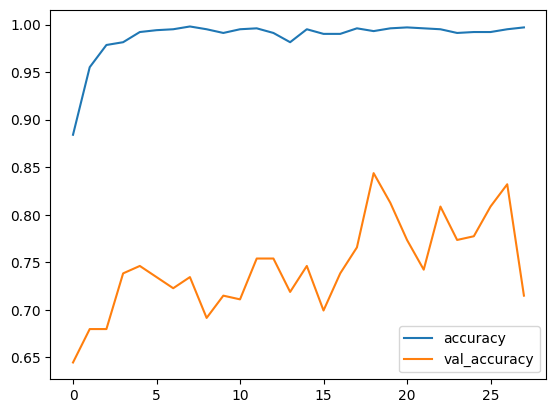

In [61]:
plt.plot(history.history['accuracy'],label='accuracy')
plt.plot(history.history['val_accuracy'],label='val_accuracy')
plt.legend()
plt.show()

**Blatantly overfitting **

In [1]:
from PIL import Image
url = "https://upload.wikimedia.org/wikipedia/commons/thumb/9/90/Brad_Pitt-69858.jpg/960px-Brad_Pitt-69858.jpg"
image_path = tf.keras.utils.get_file("x.jpg", origin=url)

img = Image.open(image_path).resize((IMG_SIZE, IMG_SIZE))
img_array = np.expand_dims(np.array(img) / 255.0, axis=0)

prediction = model.predict(img_array)
print(prediction)

if prediction < 0.5:
    print("Human")
else:
    print("Horse")

NameError: name 'tf' is not defined